В этом блокноте мы рассмотрим несколько примеров построения моделей обнаружения и отслеживания объектов на видео.

Для выполнения заданий, описанных ниже, используйте предварительно обученную модель yolov3 из рассмотренного примера. Файл архитектуры обученной модели в формате .cfg и файл с именами классов, которые может распознавать модель, доступны [по ссылке](https://courses.openedu.ru/assets/courseware/v1/085a97f44534c90c7b172a940c13923b/asset-v1:ITMOUniversity+COMPVIS+spring_2024_ITMO_bac+type@asset+block/Comp_Vision_Task_4_Model_files.zip). Файл с весами модели находится [здесь](https://pjreddie.com/media/files/yolov3.weights).

Для следующего видео выполните детектирование объектов. Считать, что модель обнаружила объект, если вероятность отнесения объекта к назначенному классу превышает `0.5` . Для полученных прямоугольников выполните процедуру `Non maximum suppression` при помощи метода `.NMSBoxes()` из библиотеки `cv2` с параметрами `score_threshold = 0.5`, `nms_threshold = 0.3`.

Исходный файл с видео доступен по [ссылке](https://courses.openedu.ru/assets/courseware/v1/7fa0d5c5bd5804bda8c54cb177416144/asset-v1:ITMOUniversity+COMPVIS+spring_2024_ITMO_bac+type@asset+block/var_MOT17-13-SDP_0.mp4).

1. Укажите количество кадров в видео.
2. Определите максимальное количество распознанных объектов одновременно находящихся в кадре.
3. Определите максимальное количество классов распознанных объектов одновременно находящихся в кадре.
Для кадра с номером `16` (нумерация начинается с нуля) определите объект, который модель обнаружила с наибольшей уверенностью.
- Введите вероятность отнесения этого объекта к назначенному классу.
- Введите метку назначенного класса.
- Введите координаты соответствующего прямоугольника

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [2]:
!pip install -q filterpy

In [3]:
import os
from os.path import exists, join, basename, splitext
if not exists('yolov3.weights'):
  !wget -q  https://pjreddie.com/media/files/yolov3.weights

!gdown 1D2-_P5En1RpdV6MsSAPh-uVXmDI2r1qC
!gdown 1l3U99bQqK5en4uc4a8FJk_b8xJYUr2n4

Downloading...
From: https://drive.google.com/uc?id=1D2-_P5En1RpdV6MsSAPh-uVXmDI2r1qC
To: /content/yolov3.cfg
100% 9.13k/9.13k [00:00<00:00, 23.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1l3U99bQqK5en4uc4a8FJk_b8xJYUr2n4
To: /content/coco.names
100% 625/625 [00:00<00:00, 2.69MB/s]


In [4]:
def load_class_names(namesfile):
    class_names = []
    with open(namesfile, 'r') as fp:
        lines = fp.readlines()
    for line in lines:
        line = line.rstrip()
        class_names.append(line)
    return class_names

In [5]:
import random

try:
  from numba import jit
except:
  def jit(func):
    return func

np.random.seed(0)

from filterpy.kalman import KalmanFilter

In [6]:
def linear_assignment(cost_matrix):
  try:
    import lap
    _, x, y = lap.lapjv(cost_matrix, extend_cost=True)
    return np.array([[y[i],i] for i in x if i >= 0]) #
  except ImportError:
    from scipy.optimize import linear_sum_assignment
    x, y = linear_sum_assignment(cost_matrix)
    return np.array(list(zip(x, y)))


@jit
def iou(bb_test, bb_gt):
  """
  Computes IUO between two bboxes in the form [x1,y1,x2,y2]
  """
  xx1 = np.maximum(bb_test[0], bb_gt[0])
  yy1 = np.maximum(bb_test[1], bb_gt[1])
  xx2 = np.minimum(bb_test[2], bb_gt[2])
  yy2 = np.minimum(bb_test[3], bb_gt[3])
  w = np.maximum(0., xx2 - xx1)
  h = np.maximum(0., yy2 - yy1)
  wh = w * h
  o = wh / ((bb_test[2] - bb_test[0]) * (bb_test[3] - bb_test[1])
    + (bb_gt[2] - bb_gt[0]) * (bb_gt[3] - bb_gt[1]) - wh)
  return(o)


def convert_bbox_to_z(bbox):
  """
  Takes a bounding box in the form [x1,y1,x2,y2] and returns z in the form
    [x,y,s,r] where x,y is the centre of the box and s is the scale/area and r is
    the aspect ratio
  """
  w = bbox[2] - bbox[0]
  h = bbox[3] - bbox[1]
  x = bbox[0] + w/2.
  y = bbox[1] + h/2.
  s = w * h    #scale is just area
  r = w / float(h)
  return np.array([x, y, s, r]).reshape((4, 1))


def convert_x_to_bbox(x,score=None):
  """
  Takes a bounding box in the centre form [x,y,s,r] and returns it in the form
    [x1,y1,x2,y2] where x1,y1 is the top left and x2,y2 is the bottom right
  """
  w = np.sqrt(x[2] * x[3])
  h = x[2] / w
  if(score==None):
    return np.array([x[0]-w/2.,x[1]-h/2.,x[0]+w/2.,x[1]+h/2.]).reshape((1,4))
  else:
    return np.array([x[0]-w/2.,x[1]-h/2.,x[0]+w/2.,x[1]+h/2.,score]).reshape((1,5))


class KalmanBoxTracker(object):
  """
  This class represents the internal state of individual tracked objects observed as bbox.
  """
  count = 0
  def __init__(self,bbox):
    """
    Initialises a tracker using initial bounding box.
    """
    #define constant velocity model
    self.kf = KalmanFilter(dim_x=7, dim_z=4)
    self.kf.F = np.array([[1,0,0,0,1,0,0],[0,1,0,0,0,1,0],[0,0,1,0,0,0,1],[0,0,0,1,0,0,0],  [0,0,0,0,1,0,0],[0,0,0,0,0,1,0],[0,0,0,0,0,0,1]])
    self.kf.H = np.array([[1,0,0,0,0,0,0],[0,1,0,0,0,0,0],[0,0,1,0,0,0,0],[0,0,0,1,0,0,0]])

    self.kf.R[2:,2:] *= 10.
    self.kf.P[4:,4:] *= 1000. #give high uncertainty to the unobservable initial velocities
    self.kf.P *= 10.
    self.kf.Q[-1,-1] *= 0.01
    self.kf.Q[4:,4:] *= 0.01

    self.kf.x[:4] = convert_bbox_to_z(bbox)
    self.time_since_update = 0
    self.id = KalmanBoxTracker.count
    KalmanBoxTracker.count += 1
    self.history = []
    self.hits = 0
    self.hit_streak = 0
    self.age = 0

  def update(self,bbox):
    """
    Updates the state vector with observed bbox.
    """
    self.time_since_update = 0
    self.history = []
    self.hits += 1
    self.hit_streak += 1
    self.kf.update(convert_bbox_to_z(bbox))

  def predict(self):
    """
    Advances the state vector and returns the predicted bounding box estimate.
    """
    if((self.kf.x[6]+self.kf.x[2])<=0):
      self.kf.x[6] *= 0.0
    self.kf.predict()
    self.age += 1
    if(self.time_since_update>0):
      self.hit_streak = 0
    self.time_since_update += 1
    self.history.append(convert_x_to_bbox(self.kf.x))
    return self.history[-1]

  def get_state(self):
    """
    Returns the current bounding box estimate.
    """
    return convert_x_to_bbox(self.kf.x)


def associate_detections_to_trackers(detections,trackers,iou_threshold = 0.3):
  """
  Assigns detections to tracked object (both represented as bounding boxes)
  Returns 3 lists of matches, unmatched_detections and unmatched_trackers
  """
  if(len(trackers)==0):
    return np.empty((0,2),dtype=int), np.arange(len(detections)), np.empty((0,5),dtype=int)
  iou_matrix = np.zeros((len(detections),len(trackers)),dtype=np.float32)

  for d,det in enumerate(detections):
    for t,trk in enumerate(trackers):
      iou_matrix[d,t] = iou(det,trk)

  if min(iou_matrix.shape) > 0:
    a = (iou_matrix > iou_threshold).astype(np.int32)
    if a.sum(1).max() == 1 and a.sum(0).max() == 1:
        matched_indices = np.stack(np.where(a), axis=1)
    else:
      matched_indices = linear_assignment(-iou_matrix)
  else:
    matched_indices = np.empty(shape=(0,2))

  unmatched_detections = []
  for d, det in enumerate(detections):
    if(d not in matched_indices[:,0]):
      unmatched_detections.append(d)
  unmatched_trackers = []
  for t, trk in enumerate(trackers):
    if(t not in matched_indices[:,1]):
      unmatched_trackers.append(t)

  #filter out matched with low IOU
  matches = []
  for m in matched_indices:
    if(iou_matrix[m[0], m[1]]<iou_threshold):
      unmatched_detections.append(m[0])
      unmatched_trackers.append(m[1])
    else:
      matches.append(m.reshape(1,2))
  if(len(matches)==0):
    matches = np.empty((0,2),dtype=int)
  else:
    matches = np.concatenate(matches,axis=0)

  return matches, np.array(unmatched_detections), np.array(unmatched_trackers)


class Sort(object):
  def __init__(self, max_age=1, min_hits=3):
    """
    Sets key parameters for SORT
    """
    self.max_age = max_age
    self.min_hits = min_hits
    self.trackers = []
    self.frame_count = 0

  def update(self, dets=np.empty((0, 5))):
    """
    Params:
      dets - a numpy array of detections in the format [[x1,y1,x2,y2,score],[x1,y1,x2,y2,score],...]
    Requires: this method must be called once for each frame even with empty detections (use np.empty((0, 5)) for frames without detections).
    Returns the a similar array, where the last column is the object ID.
    NOTE: The number of objects returned may differ from the number of detections provided.
    """
    self.frame_count += 1
    # get predicted locations from existing trackers.
    trks = np.zeros((len(self.trackers), 5))
    to_del = []
    ret = []
    for t, trk in enumerate(trks):
      pos = self.trackers[t].predict()[0]
      trk[:] = [pos[0], pos[1], pos[2], pos[3], 0]
      if np.any(np.isnan(pos)):
        to_del.append(t)
    trks = np.ma.compress_rows(np.ma.masked_invalid(trks))
    for t in reversed(to_del):
      self.trackers.pop(t)
    matched, unmatched_dets, unmatched_trks = associate_detections_to_trackers(dets,trks)

    # update matched trackers with assigned detections
    for m in matched:
      self.trackers[m[1]].update(dets[m[0], :])

    # create and initialise new trackers for unmatched detections
    for i in unmatched_dets:
        trk = KalmanBoxTracker(dets[i,:])
        self.trackers.append(trk)
    i = len(self.trackers)
    for trk in reversed(self.trackers):
        d = trk.get_state()[0]
        if (trk.time_since_update < 1) and (trk.hit_streak >= self.min_hits or self.frame_count <= self.min_hits):
          ret.append(np.concatenate((d,[trk.id+1])).reshape(1,-1)) # +1 as MOT benchmark requires positive
        i -= 1
        # remove dead tracklet
        if(trk.time_since_update > self.max_age):
          self.trackers.pop(i)
    if(len(ret)>0):
      return np.concatenate(ret)
    return np.empty((0,5))

<ipython-input-6-5788c8758f8c>:13: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def iou(bb_test, bb_gt):


Количество кадров в видео: 100


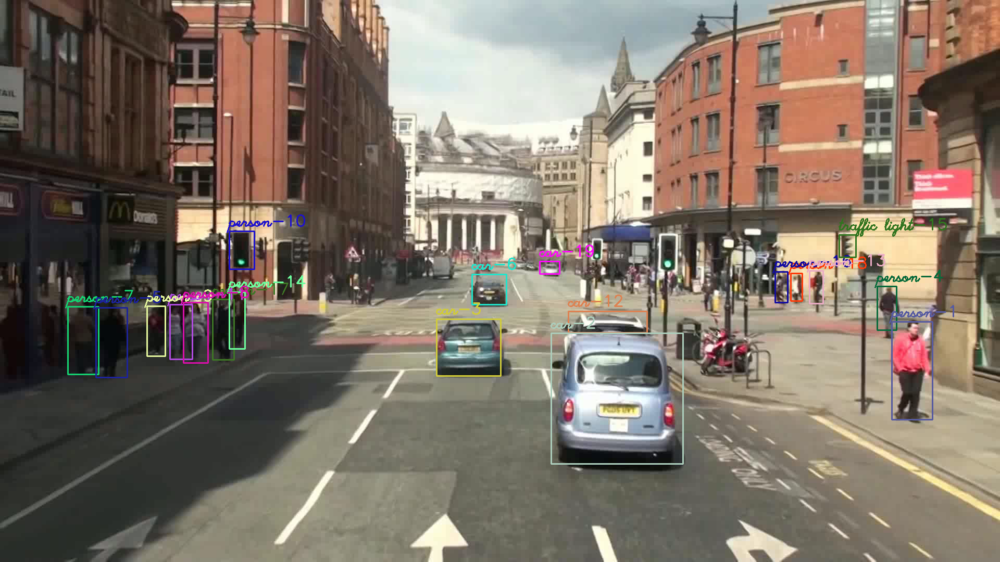

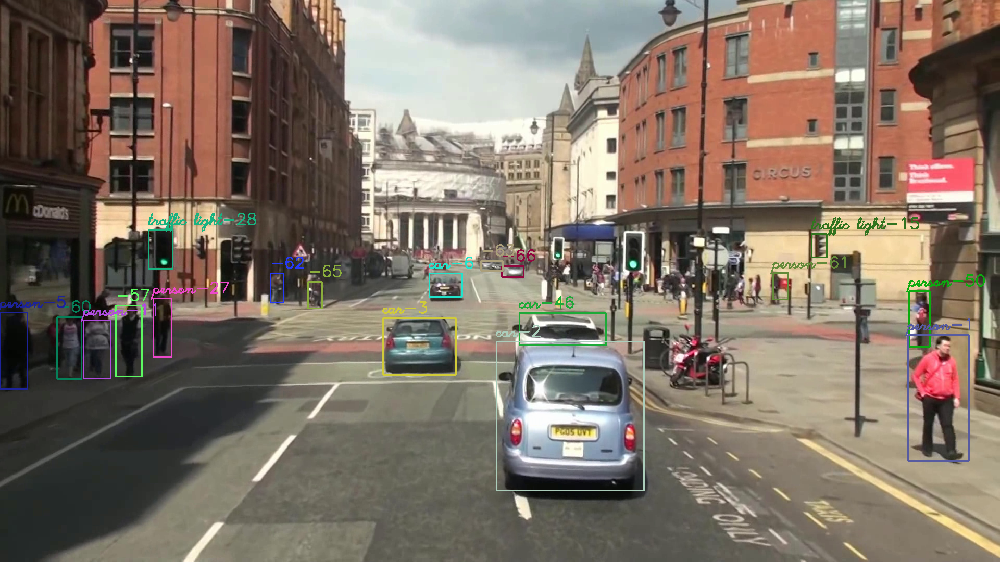

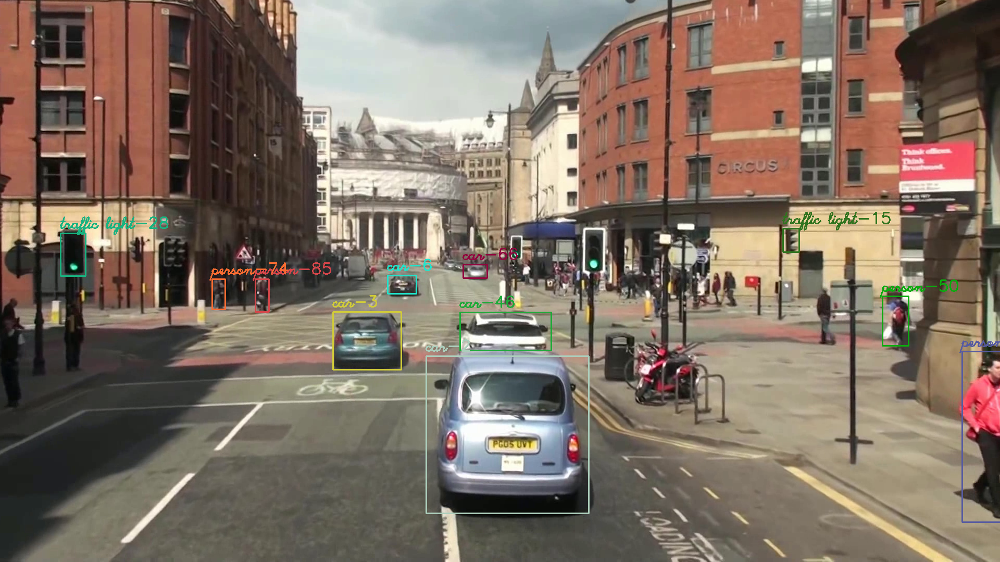

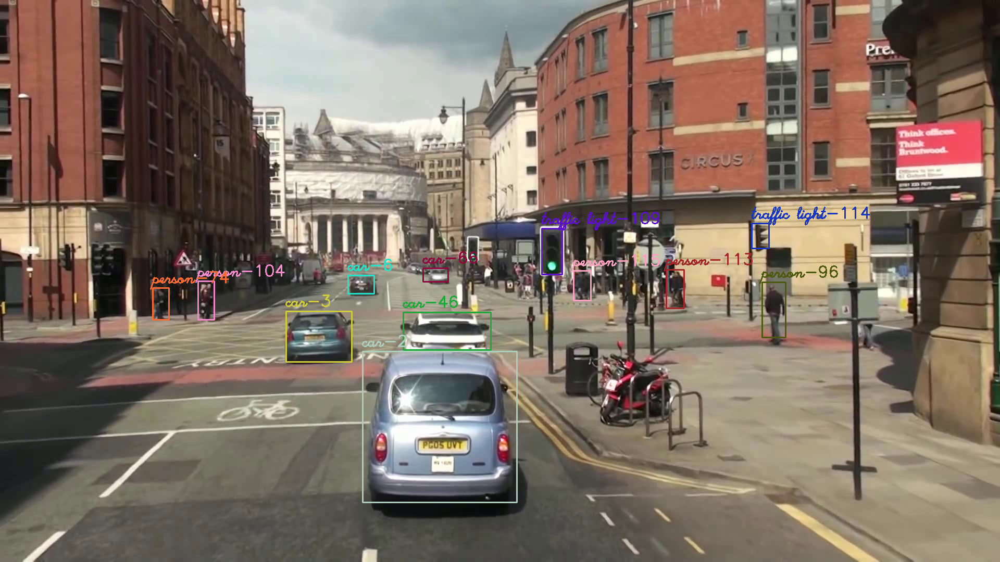

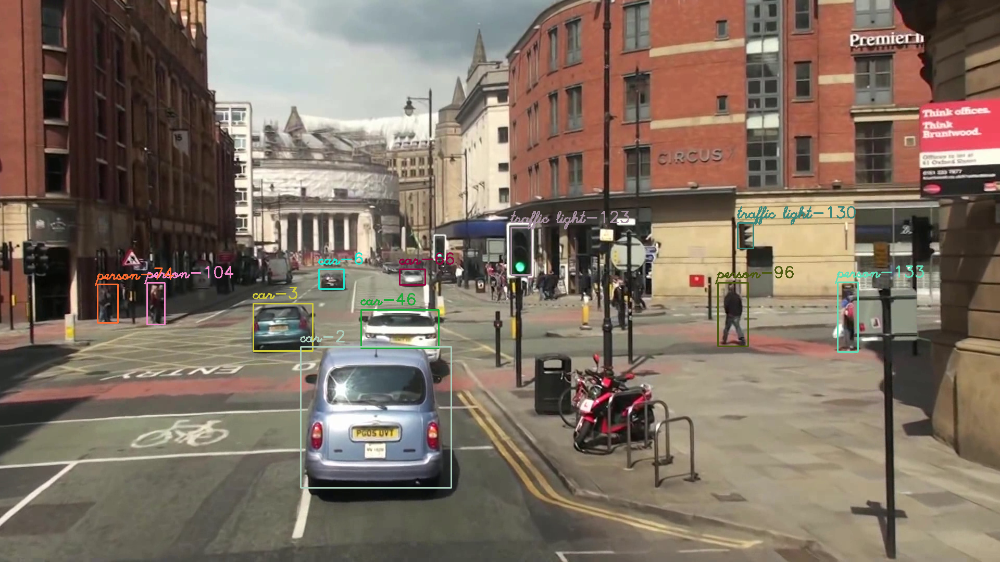

Максимальное количество распознанных объектов в кадре: 22
Максимальное количество классов в кадре: 4
Наибольшая уверенность в кадре 16: 0.9973655939102173
Метка класса: person
Координаты: x=1739, y=636, w=107, h=234


In [7]:
max_objects_in_frame = 0
max_classes_in_frame = 0
frame_detections = {}
# Загружаем сеть
net = cv2.dnn.readNetFromDarknet('yolov3.cfg', 'yolov3.weights')
ln = net.getLayerNames()
ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]
# Инициализируем трекер
mot_tracker = Sort()
# Используем YOLO
namesfile = 'coco.names'
class_names = load_class_names(namesfile)
# Указываем необходимый видео-файл
cap = cv2.VideoCapture("video.mp4")
# Подсчет количества кадров
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Количество кадров в видео: {frame_count}")
# Указываем кодеки для результирующего видео
fourcc = cv2.VideoWriter_fourcc(*'XVID')
videoWidth = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
videoHeight = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
# Определяем результирующее видео
out = cv2.VideoWriter('output_SORT.avi',fourcc, 20.0,(videoWidth,videoHeight))
# Генерируем будующим прямоугольникам разные цвета
color_list = []
for j in range(1000):
  color_list.append(((int)(random.randrange(255)),(int)(random.randrange(255)),(int)(random.randrange(255))))

names_to_ids = ['' for _ in range(1000)]
kk = 0
ret, img = cap.read()
while ret:
  # Запустим сеть по кадру
  blob = cv2.dnn.blobFromImage(img, 1 / 255.0, (416, 416), swapRB=True, crop=False)
  h,w,_ = img.shape
  net.setInput(blob)
  layerOutputs = net.forward(ln)
  # Разберём все выходы
  boxes=[]
  confidences=[]
  classIDs=[]
  for output in layerOutputs:
    for detection in output:
      scores = detection[5:]
      classID = np.argmax(scores)
      confidence = scores[classID]
      if confidence > 0.5:
        box = detection[0:4] * np.array([w, h, w, h])
        (centerX, centerY, width, height) = box.astype("int")
        x = int(centerX - (width / 2))
        y = int(centerY - (height / 2))
        boxes.append([x, y, int(width), int(height)])
        confidences.append(float(confidence))
        classIDs.append(classID)

  idxs = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.3)
  num_objects = len(idxs)
  if num_objects > max_objects_in_frame:
      max_objects_in_frame = num_objects

  # Track unique classes in the current frame
  unique_classes = set(classIDs[i] for i in idxs)
  if len(unique_classes) > max_classes_in_frame:
      max_classes_in_frame = len(unique_classes)

  # Store detections for frame 16
  if kk == 16:
      frame_detections[kk] = [(classIDs[i], confidences[i], boxes[i]) for i in idxs]

  result_img = np.copy(img)
  dets = []
  # Формат, необходимый для трекера
  detects = np.zeros((len(idxs),5))
  count=0
  names = ['' for _ in range(videoWidth)]
  for j in range(len(idxs)):
    b = boxes[idxs[j]]
    name = class_names[classIDs[idxs[j]]]
    x1 = int(b[0])
    y1 = int(b[1])
    x2 = int((b[0] + b[2]))
    y2 = int((b[1] + b[3]))
    box = np.array([x1,y1,x2,y2,confidences[idxs[j]]])
    detects[count,:] = box[:]
    names[x1] = name
    count+=1
  # Парсим данные трекера
  if len(detects)!= 0:
    trackers = mot_tracker.update(detects)
    if len(detects)!= 0:
      trackers = mot_tracker.update(detects)
      for d in trackers:
        if(len(names_to_ids) == 0 or names_to_ids[(int)(d[4])] == ''):
          result_img = cv2.rectangle(result_img, ((int)(d[0]), (int)(d[1])), ((int)(d[2]), (int)(d[3])), color_list[(int)(d[4])], 2)
          result_img = cv2.putText(result_img, names[(int)(d[0])] + "-" + str(int(d[4])), ((int)(d[0]), (int)(d[1]) - 10), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 1, color_list[(int)(d[4])], 2)
          names_to_ids[(int)(d[4])] = names[(int)(d[0])]
        else:
          result_img = cv2.rectangle(result_img, ((int)(d[0]), (int)(d[1])), ((int)(d[2]), (int)(d[3])), color_list[(int)(d[4])], 2)
          result_img = cv2.putText(result_img, str(names_to_ids[(int)(d[4])]) + "-" + str(int(d[4])), ((int)(d[0]), (int)(d[1]) - 10), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 1, color_list[(int)(d[4])], 2)


  if kk % 20 == 0 and kk < 100:
    cv2_imshow(result_img) # выводим только ограниченное количество кадров
  out.write(result_img) # пишем кадр в результирующее видео
  kk += 1
  ret, img = cap.read()
cap.release()
out.release()
cv2.destroyAllWindows()
print(f"Максимальное количество распознанных объектов в кадре: {max_objects_in_frame}")
print(f"Максимальное количество классов в кадре: {max_classes_in_frame}")
# Analyze frame 16
if 16 in frame_detections:
    frame_16_detections = frame_detections[16]
    if frame_16_detections:
        highest_confidence_detection = max(frame_16_detections, key=lambda x: x[1])
        classID, confidence, box = highest_confidence_detection
        class_label = class_names[classID]
        x, y, w, h = box

        print(f"Наибольшая уверенность в кадре 16: {confidence}")
        print(f"Метка класса: {class_label}")
        print(f"Координаты: x={x}, y={y}, w={w}, h={h}")
    else:
        print("В кадре 16 не обнаружено объектов.")
else:
    print("Кадр 16 не был обработан.")